In [4]:
import pandas as pd
import numpy as np
import tensorflow as tf
import seaborn as sns
from PIL import Image, ImageChops, ImageEnhance
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import load_model

In [5]:
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import BatchNormalization
import torch
import torch.nn as nn
import torch.nn.functional as F

In [6]:
wday_off = pd.read_csv('wday_off.csv')
wday_peak = pd.read_csv('wday_peak.csv')
wend_off = pd.read_csv('wend_off.csv')
wend_peak = pd.read_csv('wend_peak.csv')

In [7]:
wday_off.iloc[:500]

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Unnamed: 8,Data1,...,Data41,Data42,Data43,Data44,Data45,Data46,Data47,Data48,Data49,Data50
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,NaN,89.587892,...,73.957197,88.184778,72.003206,88.184778,73.852526,75.069991,72.673921,77.629445,77.629445,83.310242
1,1,0,103.946006,30.750660,48,103.956494,30.745080,1179.207157,NaN,121.986947,...,113.506571,113.506571,140.895778,142.619070,139.213634,146.195291,132.868412,162.493618,162.493618,209.120481
2,2,0,103.946006,30.750660,64,103.941276,30.754493,620.905375,NaN,41.285580,...,59.448387,59.448387,59.448387,59.448387,44.218780,46.230804,45.202414,43.339978,43.774969,45.202414
3,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,NaN,37.796143,...,38.472874,46.950858,50.244426,49.761663,51.894196,60.764919,50.244426,46.755229,32.152593,32.152593
4,4,1,104.062539,30.739077,1288,104.062071,30.732501,730.287581,NaN,60.548947,...,80.810511,80.810511,76.872377,77.360119,76.872377,75.819331,75.222755,75.222755,75.222755,74.794745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,495,161,104.047886,30.580959,635,104.047792,30.584757,421.055211,NaN,44.784285,...,46.227471,42.152357,51.174840,35.834486,35.834486,35.834486,32.458218,32.458218,32.458218,32.458218
496,496,161,104.047886,30.580959,1087,104.052104,30.581115,404.826308,NaN,33.502867,...,38.432877,40.527662,34.754995,34.325242,34.384716,35.133336,33.667334,36.426779,31.074088,33.477214
497,497,161,104.047886,30.580959,1125,104.043887,30.580893,383.535189,NaN,37.570794,...,19.044506,27.233268,52.004771,37.116309,29.994063,27.945219,25.832117,37.350586,31.716539,34.303768
498,498,161,104.047886,30.580959,1155,104.047911,30.577753,355.324460,NaN,31.324282,...,29.100161,36.271306,25.841208,24.679103,23.804703,25.620190,25.833391,26.483811,21.160762,26.483811


In [8]:
wday_peak

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Unnamed: 8,Data1,...,Data41,Data42,Data43,Data44,Data45,Data46,Data47,Data48,Data49,Data50
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,NaN,93.401342,...,74.129457,74.119060,74.124259,74.121659,74.122959,74.122309,74.122634,74.122472,74.122553,74.122512
1,1,0,103.946006,30.750660,48,103.956494,30.745080,1179.207157,NaN,151.747838,...,167.600790,167.600853,167.600822,167.600822,167.600822,119.919372,139.806425,129.101529,134.240903,131.621066
2,2,0,103.946006,30.750660,64,103.941276,30.754493,620.905375,NaN,67.420164,...,87.069450,111.902846,96.288095,52.718381,68.133314,59.442741,63.492023,61.400693,62.428849,61.910503
3,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,NaN,45.788582,...,101.498789,101.498789,101.498789,101.498789,101.498789,101.498789,101.498789,101.498789,101.498789,101.498789
4,4,1,104.062539,30.739077,1288,104.062071,30.732501,730.287581,NaN,147.692628,...,100.583743,100.579643,100.581693,100.580668,100.581180,100.580924,100.581052,100.580988,100.581020,100.581004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,5938,1900,104.029570,30.670992,1729,104.031714,30.670676,208.333343,NaN,52.763821,...,55.705607,39.874337,26.533020,34.653467,33.088237,49.019610,29.128908,51.369865,42.789225,52.050476
5939,5939,1901,104.025686,30.626472,1233,104.023241,30.622808,468.731933,NaN,46.294512,...,60.276729,60.247962,46.632986,57.014459,48.911158,68.353526,67.157295,71.559377,76.311360,79.627289
5940,5940,1901,104.025686,30.626472,1565,104.023113,30.627839,289.473210,NaN,56.052186,...,40.460221,41.194952,38.596428,41.851548,25.890772,45.706296,51.717298,37.030627,45.773216,37.198610
5941,5941,1901,104.025686,30.626472,1658,104.028963,30.624882,360.123488,NaN,90.660458,...,43.607284,43.780314,41.070049,59.704684,45.837757,45.251119,46.915967,46.068507,46.488375,46.277488


In [9]:
wend_off

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Unnamed: 8,Data1,...,Data41,Data42,Data43,Data44,Data45,Data46,Data47,Data48,Data49,Data50
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,NaN,83.310242,...,89.591175,89.588717,89.587489,89.588103,89.587796,89.587872,89.587911,89.587892,89.587901,89.587896
1,1,0,103.946006,30.750660,48,103.956494,30.745080,1179.207157,NaN,209.120481,...,121.986945,121.986947,121.986948,121.986947,121.986947,121.986947,121.986947,121.986947,121.986947,121.986947
2,2,0,103.946006,30.750660,64,103.941276,30.754493,620.905375,NaN,45.202414,...,44.705187,42.095280,40.901361,41.489733,41.193446,41.267120,41.304056,41.285580,41.294816,41.290197
3,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,NaN,32.152593,...,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143
4,4,1,104.062539,30.739077,1288,104.062071,30.732501,730.287581,NaN,74.794745,...,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,56.386816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,5938,1900,104.029570,30.670992,1729,104.031714,30.670676,208.333343,NaN,19.788919,...,23.148149,16.746485,22.455091,30.906595,18.598035,40.687163,21.047709,15.136227,20.053477,27.154237
5939,5939,1901,104.025686,30.626472,1233,104.023241,30.622808,468.731933,NaN,38.736879,...,51.953344,43.042589,40.722412,87.431863,40.417604,40.393416,39.590819,40.644760,45.598327,42.603589
5940,5940,1901,104.025686,30.626472,1565,104.023113,30.627839,289.473210,NaN,44.496309,...,50.246073,22.638021,50.246073,50.246073,50.246073,50.246073,50.246073,50.246073,51.335151,50.784774
5941,5941,1901,104.025686,30.626472,1658,104.028963,30.624882,360.123488,NaN,38.186879,...,62.509381,37.572658,37.907736,33.199605,32.411114,37.656066,33.306219,36.935304,37.656066,33.314242


In [10]:
wend_peak

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Unnamed: 8,Data1,...,Data41,Data42,Data43,Data44,Data45,Data46,Data47,Data48,Data49,Data50
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,NaN,78.799405,...,339.689653,339.689592,339.689561,339.689576,339.689569,339.689573,339.689572,339.689571,339.689571,339.689571
1,1,0,103.946006,30.750660,48,103.956494,30.745080,1179.207157,NaN,173.981384,...,175.419247,174.638841,174.251237,174.444824,174.347976,174.396387,174.384281,174.378230,174.381255,174.380499
2,2,0,103.946006,30.750660,64,103.941276,30.754493,620.905375,NaN,35.494392,...,44.870178,45.164097,45.312504,45.238179,45.275311,45.256737,45.261379,45.263701,45.261379,41.089326
3,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,NaN,51.160737,...,110.212400,110.212400,66.137063,107.896683,107.087237,108.809238,62.805532,174.423654,102.377641,64.489972
4,4,1,104.062539,30.739077,1288,104.062071,30.732501,730.287581,NaN,129.828903,...,139.842303,123.364534,116.500825,119.834478,119.834478,119.834478,115.210311,95.427778,110.929759,122.362015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,5938,1900,104.029570,30.670992,1729,104.031714,30.670676,208.333343,NaN,37.267082,...,87.890629,50.223217,51.369865,28.195490,20.818877,58.593753,59.794991,42.313119,28.517112,42.016809
5939,5939,1901,104.025686,30.626472,1233,104.023241,30.622808,468.731933,NaN,58.112267,...,54.190838,56.831938,50.889594,52.108131,53.153443,66.850746,41.083233,60.007819,63.524246,52.711752
5940,5940,1901,104.025686,30.626472,1565,104.023113,30.627839,289.473210,NaN,60.150277,...,45.767261,45.946487,45.946487,60.941728,52.392274,56.344533,55.301601,54.794481,55.046873,54.983557
5941,5941,1901,104.025686,30.626472,1658,104.028963,30.624882,360.123488,NaN,46.356778,...,37.067750,37.815592,39.234184,40.906378,38.484440,31.834120,33.271494,39.960244,53.242076,44.398786


In [11]:
wday_off

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Unnamed: 8,Data1,...,Data41,Data42,Data43,Data44,Data45,Data46,Data47,Data48,Data49,Data50
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,NaN,89.587892,...,73.957197,88.184778,72.003206,88.184778,73.852526,75.069991,72.673921,77.629445,77.629445,83.310242
1,1,0,103.946006,30.750660,48,103.956494,30.745080,1179.207157,NaN,121.986947,...,113.506571,113.506571,140.895778,142.619070,139.213634,146.195291,132.868412,162.493618,162.493618,209.120481
2,2,0,103.946006,30.750660,64,103.941276,30.754493,620.905375,NaN,41.285580,...,59.448387,59.448387,59.448387,59.448387,44.218780,46.230804,45.202414,43.339978,43.774969,45.202414
3,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,NaN,37.796143,...,38.472874,46.950858,50.244426,49.761663,51.894196,60.764919,50.244426,46.755229,32.152593,32.152593
4,4,1,104.062539,30.739077,1288,104.062071,30.732501,730.287581,NaN,60.548947,...,80.810511,80.810511,76.872377,77.360119,76.872377,75.819331,75.222755,75.222755,75.222755,74.794745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,5938,1900,104.029570,30.670992,1729,104.031714,30.670676,208.333343,NaN,15.136227,...,18.137848,21.428572,21.783739,20.197487,16.406892,20.856508,26.785715,27.444883,19.788919,19.788919
5939,5939,1901,104.025686,30.626472,1233,104.023241,30.622808,468.731933,NaN,40.644760,...,47.036515,43.083732,48.099051,43.433164,50.507828,49.743827,56.310399,42.064937,40.425000,38.736879
5940,5940,1901,104.025686,30.626472,1565,104.023113,30.627839,289.473210,NaN,50.246073,...,37.986764,39.523523,39.523523,37.986764,37.986764,37.986764,37.986764,37.986764,37.986764,44.496309
5941,5941,1901,104.025686,30.626472,1658,104.028963,30.624882,360.123488,NaN,36.935304,...,49.169831,40.066719,40.262253,40.262253,40.262253,40.262253,40.513892,36.142025,38.186879,38.186879


In [12]:
wday_off['avg_time'] = (wday_off.iloc[:,9:].sum(axis = 1) / 50)
wday_peak['avg_time'] = (wday_peak.iloc[:,9:].sum(axis = 1) / 50)
wend_off['avg_time'] = (wend_off.iloc[:,9:].sum(axis = 1) / 50)
wend_peak['avg_time'] = (wend_peak.iloc[:,9:].sum(axis = 1) / 50)

In [13]:
wday_off

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Unnamed: 8,Data1,...,Data42,Data43,Data44,Data45,Data46,Data47,Data48,Data49,Data50,avg_time
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,NaN,89.587892,...,88.184778,72.003206,88.184778,73.852526,75.069991,72.673921,77.629445,77.629445,83.310242,85.424151
1,1,0,103.946006,30.750660,48,103.956494,30.745080,1179.207157,NaN,121.986947,...,113.506571,140.895778,142.619070,139.213634,146.195291,132.868412,162.493618,162.493618,209.120481,125.386769
2,2,0,103.946006,30.750660,64,103.941276,30.754493,620.905375,NaN,41.285580,...,59.448387,59.448387,59.448387,44.218780,46.230804,45.202414,43.339978,43.774969,45.202414,53.618874
3,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,NaN,37.796143,...,46.950858,50.244426,49.761663,51.894196,60.764919,50.244426,46.755229,32.152593,32.152593,40.787167
4,4,1,104.062539,30.739077,1288,104.062071,30.732501,730.287581,NaN,60.548947,...,80.810511,76.872377,77.360119,76.872377,75.819331,75.222755,75.222755,75.222755,74.794745,77.209144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,5938,1900,104.029570,30.670992,1729,104.031714,30.670676,208.333343,NaN,15.136227,...,21.428572,21.783739,20.197487,16.406892,20.856508,26.785715,27.444883,19.788919,19.788919,21.247776
5939,5939,1901,104.025686,30.626472,1233,104.023241,30.622808,468.731933,NaN,40.644760,...,43.083732,48.099051,43.433164,50.507828,49.743827,56.310399,42.064937,40.425000,38.736879,47.172532
5940,5940,1901,104.025686,30.626472,1565,104.023113,30.627839,289.473210,NaN,50.246073,...,39.523523,39.523523,37.986764,37.986764,37.986764,37.986764,37.986764,37.986764,44.496309,41.050324
5941,5941,1901,104.025686,30.626472,1658,104.028963,30.624882,360.123488,NaN,36.935304,...,40.066719,40.262253,40.262253,40.262253,40.262253,40.513892,36.142025,38.186879,38.186879,42.633222


<AxesSubplot:>

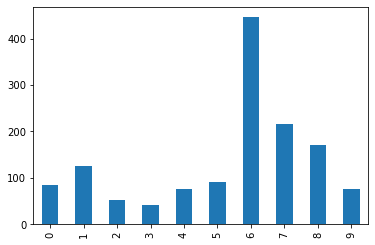

In [14]:
wday_off['avg_time'].head(10).plot(kind='bar')

In [15]:
wday_off['avg_time'].iloc[209]

44.842725492999996

In [16]:
wday_off_data = wday_off.iloc[:,9:-1]

In [17]:
wday_off_data

,Data1,Data2,Data3,Data4,Data5,Data6,Data7,Data8,Data9,Data10,...,Data41,Data42,Data43,Data44,Data45,Data46,Data47,Data48,Data49,Data50
0,89.587892,89.587911,89.587872,89.587949,89.587796,89.588103,89.587489,89.588717,89.586260,89.591175,...,73.957197,88.184778,72.003206,88.184778,73.852526,75.069991,72.673921,77.629445,77.629445,83.310242
1,121.986947,121.986947,121.986947,121.986947,121.986947,121.986947,121.986948,121.986947,121.986948,121.986945,...,113.506571,113.506571,140.895778,142.619070,139.213634,146.195291,132.868412,162.493618,162.493618,209.120481
2,41.285580,41.304056,41.267120,41.341058,41.193446,41.489733,40.901361,42.095280,39.773298,44.705187,...,59.448387,59.448387,59.448387,59.448387,44.218780,46.230804,45.202414,43.339978,43.774969,45.202414
3,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,...,38.472874,46.950858,50.244426,49.761663,51.894196,60.764919,50.244426,46.755229,32.152593,32.152593
4,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,...,80.810511,80.810511,76.872377,77.360119,76.872377,75.819331,75.222755,75.222755,75.222755,74.794745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,15.136227,21.047709,40.687163,18.374817,18.598035,30.906595,22.455091,16.746485,23.017850,23.148149,...,18.137848,21.428572,21.783739,20.197487,16.406892,20.856508,26.785715,27.444883,19.788919,19.788919
5939,40.644760,39.590819,40.393416,40.369257,40.417604,87.431863,40.722412,43.042589,42.322098,51.953344,...,47.036515,43.083732,48.099051,43.433164,50.507828,49.743827,56.310399,42.064937,40.425000,38.736879
5940,50.246073,50.246073,50.246073,50.246073,50.246073,50.246073,50.246073,22.638021,50.246073,50.246073,...,37.986764,39.523523,39.523523,37.986764,37.986764,37.986764,37.986764,37.986764,37.986764,44.496309
5941,36.935304,33.306219,37.656066,43.470737,32.411114,33.199605,37.907736,37.572658,41.753448,62.509381,...,49.169831,40.066719,40.262253,40.262253,40.262253,40.262253,40.513892,36.142025,38.186879,38.186879


In [18]:
np.array(wday_off_data.iloc[0])

array([ 89.58789169,  89.58791089,  89.58787247,  89.58794928,
        89.58779569,  89.58810286,  89.58748852,  89.58871721,
        89.58625985,  89.59117473,  89.58134548,  89.60100616,
        89.56169345,  89.64035338,  89.48317141,  89.79808855,
        89.17045533,  90.4346197 ,  87.94114664,  93.07361825,
        83.34514412, 105.3733363 ,  68.93446258,  68.93446258,
        68.93446258,  76.48783506,  88.18477793,  88.18477793,
        88.18477793,  88.18477793,  88.18477793,  88.18477793,
        88.18477793,  81.64855085,  82.6697939 ,  88.18477793,
        88.18477793,  88.18477793,  88.18477793,  88.18477793,
        73.95719666,  88.18477793,  72.0032063 ,  88.18477793,
        73.85252649,  75.06999066,  72.6739211 ,  77.62944454,
        77.62944454,  83.31024246])

In [19]:
# # define input sequence
# 
# # reshape input into [samples, timesteps, features]
# n_in = len(sequence)
# sequence = sequence.reshape((1, n_in, 1))
# # define model
# model = Sequential()
# model.add(LSTM(100, activation='relu', input_shape=(n_in,1)))
# model.add(RepeatVector(n_in))
# model.add(LSTM(100, activation='relu', return_sequences=True))
# model.add(TimeDistributed(Dense(1)))
# model.compile(optimizer='adam', loss='mse')
# # fit model
# model.fit(sequence, sequence, epochs=300, verbose=0)
# plot_model(model, show_shapes=True, to_file='reconstruct_lstm_autoencoder.png')
# # demonstrate recreation
# y_pred = model.predict(sequence, verbose=0)
# print(y_pred[0,:,0])

In [20]:
# (118,50,50)

In [21]:
X = np.array(wday_off_data)
timesteps = X.shape[0]
n_features = 50
X = X.reshape(timesteps,1, n_features)

In [22]:
X.shape

(5943, 1, 50)

In [23]:
Xt = X/1000

In [24]:
# model = Sequential([                                   
#       tf.keras.layers.LSTM(filters = 128,kernel_size = (11,11,1),strides = (4,4,1), padding='valid',input_shape = (227,227,10,1),activation='tanh'),
#       tf.keras.layers.LSTM(filters = 64, kernel_size = (5,5,1), strides = (2,2,1), padding='valid', activation='tanh'),
#       tf.keras.layers.RepeatVector(filters=64, kernel_size=(3,3), strides = 1, padding = 'same', dropout=0.4, recurrent_dropout=0.3, return_sequences = True),
#       tf.keras.layers.ConvLSTM2D(filters=32,kernel_size=(3,3), strides=1,padding='same',dropout=0.3,return_sequences=True),
#       tf.keras.layers.ConvLSTM2D(filters = 64, kernel_size=(3,3),strides = 1,return_sequences = True,padding='same',dropout=0.5),
#       tf.keras.layers.Conv3DTranspose(filters = 128,kernel_size=(5,5,1),strides=(2,2,1),padding = 'valid',activation = 'tanh'),
#       tf.keras.layers.Conv3DTranspose(filters = 1,kernel_size = (11,11,1),strides = (4,4,1),padding = 'valid',activation = 'tanh')
# ])

In [25]:
model = Sequential([
        tf.keras.layers.Dense(48, activation='relu', input_shape=(1,n_features)),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(16,activation='relu'),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(48, activation='relu'),
        tf.keras.layers.Dense(n_features)
])
model.compile(optimizer='adam', loss='mse')

In [26]:
# model.fit(Xt, Xt, epochs=150)
# model.save('dense_model.h5')

In [27]:
model = load_model('dense_model.h5')

In [28]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1, 48)             2448      
                                                                 
 dense_1 (Dense)             (None, 1, 32)             1568      
                                                                 
 dense_2 (Dense)             (None, 1, 16)             528       
                                                                 
 dense_3 (Dense)             (None, 1, 32)             544       
                                                                 
 dense_4 (Dense)             (None, 1, 48)             1584      
                                                                 
 dense_5 (Dense)             (None, 1, 50)             2450      
                                                                 
Total params: 9,122
Trainable params: 9,122
Non-trainabl

In [29]:
layer_outputs=[layer.output for layer in model.layers[:4]]
activation_model=Model(inputs=model.input,outputs=layer_outputs)
activations=activation_model.predict(X)
bottleneck_activation=activations[2]

In [30]:
bottleneck_activation.shape

(5943, 1, 16)

In [31]:
bottleneck_activation

array([[[178.3539  ,   0.      ,   0.      , ..., 199.39273 ,
         158.51881 ,   0.      ]],

       [[252.15654 ,   0.      ,   0.      , ..., 382.49863 ,
         165.61609 ,   0.      ]],

       [[101.59552 ,   0.      ,   0.      , ..., 162.30322 ,
         111.13322 ,   0.      ]],

       ...,

       [[ 87.25399 ,   0.      ,   0.      , ...,  77.3846  ,
          83.05757 ,   0.      ]],

       [[ 92.33122 ,   0.      ,   0.      , ..., 105.48512 ,
          71.472305,   0.      ]],

       [[ 79.84165 ,   0.      ,   0.      , ..., 100.268265,
          22.198778,   0.      ]]], dtype=float32)

In [32]:
# demonstrate reconstruction
yhat = model.predict(Xt, verbose=0)
print('---Predicted---')
print(np.round(yhat*1000,3))
print('---Actual---')
print(np.round(X, 3))

---Predicted---
[[[ 84.94   91.276  88.848 ...  79.276  76.064  83.012]]

 [[115.829 124.194 121.281 ... 175.228 166.555 200.145]]

 [[ 39.823  42.28   40.628 ...  46.576  43.407  43.371]]

 ...

 [[ 44.693  48.542  48.054 ...  40.872  39.263  43.78 ]]

 [[ 36.591  36.856  39.284 ...  43.101  36.424  37.354]]

 [[ 22.935  25.48   29.126 ...  48.416  50.539  71.349]]]
---Actual---
[[[ 89.588  89.588  89.588 ...  77.629  77.629  83.31 ]]

 [[121.987 121.987 121.987 ... 162.494 162.494 209.12 ]]

 [[ 41.286  41.304  41.267 ...  43.34   43.775  45.202]]

 ...

 [[ 50.246  50.246  50.246 ...  37.987  37.987  44.496]]

 [[ 36.935  33.306  37.656 ...  36.142  38.187  38.187]]

 [[ 26.72   26.715  26.982 ...  26.417  73.175  73.175]]]


In [133]:
yhat.shape


(5943, 1, 50)

In [134]:
Xt.shape

(5943, 1, 50)

In [137]:
(yhat-Xt)**2

array([[[2.16053778e-05, 2.84865533e-06, 5.47000089e-07, ...,
         2.71046762e-06, 2.44964310e-06, 8.88598672e-08]],

       [[3.79189584e-05, 4.87172258e-06, 4.98701106e-07, ...,
         1.62165241e-04, 1.64954495e-05, 8.05548685e-05]],

       [[2.13795405e-06, 9.52458528e-07, 4.07868565e-07, ...,
         1.04706877e-05, 1.35228041e-07, 3.35567462e-06]],

       ...,

       [[3.08385592e-05, 2.90289926e-06, 4.80463599e-06, ...,
         8.32463108e-06, 1.62868048e-06, 5.12449107e-07]],

       [[1.18308694e-07, 1.26038535e-05, 2.64873274e-06, ...,
         4.84214433e-05, 3.10660190e-06, 6.93123694e-07]],

       [[1.43270378e-05, 1.52616664e-06, 4.59914832e-06, ...,
         4.83933521e-04, 5.12402178e-04, 3.33457480e-06]]])

##  wday_peak

In [33]:
wday_peak_data = wday_peak.iloc[:,9:-1]

In [34]:
wday_peak_data

,Data1,Data2,Data3,Data4,Data5,Data6,Data7,Data8,Data9,Data10,...,Data41,Data42,Data43,Data44,Data45,Data46,Data47,Data48,Data49,Data50
0,93.401342,93.401342,93.401342,93.401342,93.401342,95.007096,93.401342,119.443359,104.829202,111.660133,...,74.129457,74.119060,74.124259,74.121659,74.122959,74.122309,74.122634,74.122472,74.122553,74.122512
1,151.747838,147.336946,152.978226,153.254360,151.573682,136.646323,156.647445,156.647445,156.647445,156.647445,...,167.600790,167.600853,167.600822,167.600822,167.600822,119.919372,139.806425,129.101529,134.240903,131.621066
2,67.420164,80.116823,74.343437,80.116823,77.389245,39.249506,39.249506,53.507106,45.282539,49.052461,...,87.069450,111.902846,96.288095,52.718381,68.133314,59.442741,63.492023,61.400693,62.428849,61.910503
3,45.788582,45.788582,58.698806,83.532916,83.532916,83.532916,113.728936,96.319786,104.302913,100.152518,...,101.498789,101.498789,101.498789,101.498789,101.498789,101.498789,101.498789,101.498789,101.498789,101.498789
4,147.692628,144.502112,151.027215,128.931735,108.101780,108.101780,108.101780,113.271663,120.875186,118.960873,...,100.583743,100.579643,100.581693,100.580668,100.581180,100.580924,100.581052,100.580988,100.581020,100.581004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,52.763821,59.389143,47.468357,39.893619,38.143676,37.815128,34.798076,51.369865,34.145233,80.071178,...,55.705607,39.874337,26.533020,34.653467,33.088237,49.019610,29.128908,51.369865,42.789225,52.050476
5939,46.294512,91.958308,77.986595,64.668166,84.305884,62.641386,60.984450,71.438305,61.734396,53.846252,...,60.276729,60.247962,46.632986,57.014459,48.911158,68.353526,67.157295,71.559377,76.311360,79.627289
5940,56.052186,80.161812,80.161812,41.490520,80.161812,80.161812,80.161812,74.569128,69.705924,46.315714,...,40.460221,41.194952,38.596428,41.851548,25.890772,45.706296,51.717298,37.030627,45.773216,37.198610
5941,90.660458,90.660458,55.344485,51.616903,38.893337,51.616903,53.906219,53.906219,57.410991,48.996393,...,43.607284,43.780314,41.070049,59.704684,45.837757,45.251119,46.915967,46.068507,46.488375,46.277488


In [35]:
X1 = np.array(wday_peak_data)
timesteps1 = X1.shape[0]
n_features1 = 50
X1 = X1.reshape(timesteps1,1, n_features1)

In [36]:
Xt1 = X1/1000

In [37]:
yhat1 = model.predict(Xt1, verbose=0)
print('---Predicted---')
print(np.round(yhat1*1000,3))
print('---Actual---')
print(np.round(X1, 3))

---Predicted---
[[[ 90.377  98.992  93.251 ...  79.633  69.695  70.449]]

 [[143.006 151.347 146.807 ... 138.305 131.961 127.82 ]]

 [[ 60.157  71.692  55.699 ...  45.439  59.96   69.019]]

 ...

 [[ 67.944  74.342  70.941 ...  42.196  38.571  44.057]]

 [[ 65.276  70.724  64.014 ...  54.073  44.694  41.441]]

 [[ 36.939  40.825  39.074 ...  34.926  32.613  38.888]]]
---Actual---
[[[ 93.401  93.401  93.401 ...  74.122  74.123  74.123]]

 [[151.748 147.337 152.978 ... 129.102 134.241 131.621]]

 [[ 67.42   80.117  74.343 ...  61.401  62.429  61.911]]

 ...

 [[ 56.052  80.162  80.162 ...  37.031  45.773  37.199]]

 [[ 90.66   90.66   55.344 ...  46.069  46.488  46.277]]

 [[ 30.555  42.505  36.911 ...  30.396  43.578  32.11 ]]]


##  wend_off

In [38]:
wend_off_data = wend_off.iloc[:,9:-1]

In [39]:
wend_off_data

,Data1,Data2,Data3,Data4,Data5,Data6,Data7,Data8,Data9,Data10,...,Data41,Data42,Data43,Data44,Data45,Data46,Data47,Data48,Data49,Data50
0,83.310242,77.629445,77.629445,72.673921,75.069991,73.852526,88.184778,72.003206,88.184778,73.957197,...,89.591175,89.588717,89.587489,89.588103,89.587796,89.587872,89.587911,89.587892,89.587901,89.587896
1,209.120481,162.493618,162.493618,132.868412,146.195291,139.213634,142.619070,140.895778,113.506571,113.506571,...,121.986945,121.986947,121.986948,121.986947,121.986947,121.986947,121.986947,121.986947,121.986947,121.986947
2,45.202414,43.774969,43.339978,45.202414,46.230804,44.218780,59.448387,59.448387,59.448387,59.448387,...,44.705187,42.095280,40.901361,41.489733,41.193446,41.267120,41.304056,41.285580,41.294816,41.290197
3,32.152593,32.152593,46.755229,50.244426,60.764919,51.894196,49.761663,50.244426,46.950858,38.472874,...,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143,37.796143
4,74.794745,75.222755,75.222755,75.222755,75.819331,76.872377,77.360119,76.872377,80.810511,80.810511,...,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,60.548947,56.386816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,19.788919,19.788919,27.444883,26.785715,20.856508,16.406892,20.197487,21.783739,21.428572,18.137848,...,23.148149,16.746485,22.455091,30.906595,18.598035,40.687163,21.047709,15.136227,20.053477,27.154237
5939,38.736879,40.425000,42.064937,56.310399,49.743827,50.507828,43.433164,48.099051,43.083732,47.036515,...,51.953344,43.042589,40.722412,87.431863,40.417604,40.393416,39.590819,40.644760,45.598327,42.603589
5940,44.496309,37.986764,37.986764,37.986764,37.986764,37.986764,37.986764,39.523523,39.523523,37.986764,...,50.246073,22.638021,50.246073,50.246073,50.246073,50.246073,50.246073,50.246073,51.335151,50.784774
5941,38.186879,38.186879,36.142025,40.513892,40.262253,40.262253,40.262253,40.262253,40.066719,49.169831,...,62.509381,37.572658,37.907736,33.199605,32.411114,37.656066,33.306219,36.935304,37.656066,33.314242


In [40]:
X2 = np.array(wend_off_data)
timesteps2 = X2.shape[0]
n_features2 = 50
X2 = X2.reshape(timesteps2,1, n_features2)

In [41]:
Xt2 = X2 / 1000

In [42]:
yhat2 = model.predict(Xt2, verbose=0)
print('---Predicted---')
print(np.round(yhat2*1000,3))
print('---Actual---')
print(np.round(X2, 3))

---Predicted---
[[[ 74.825  79.392  77.503 ...  92.915  87.996  95.802]]

 [[156.139 168.583 155.706 ... 138.5   119.458 120.128]]

 [[ 45.345  47.06   47.858 ...  42.272  38.627  43.09 ]]

 ...

 [[ 38.981  41.228  40.41  ...  52.712  50.142  55.625]]

 [[ 38.714  40.066  41.293 ...  39.614  34.608  35.583]]

 [[ 43.494  48.326  43.511 ...  31.549  26.171  25.47 ]]]
---Actual---
[[[ 83.31   77.629  77.629 ...  89.588  89.588  89.588]]

 [[209.12  162.494 162.494 ... 121.987 121.987 121.987]]

 [[ 45.202  43.775  43.34  ...  41.286  41.295  41.29 ]]

 ...

 [[ 44.496  37.987  37.987 ...  50.246  51.335  50.785]]

 [[ 38.187  38.187  36.142 ...  36.935  37.656  33.314]]

 [[ 73.175  73.175  26.417 ...  26.72   26.718  27.73 ]]]


##  wend_peak

In [43]:
wend_peak_data = wend_peak.iloc[:,9:-1]

In [44]:
wend_peak_data

,Data1,Data2,Data3,Data4,Data5,Data6,Data7,Data8,Data9,Data10,...,Data41,Data42,Data43,Data44,Data45,Data46,Data47,Data48,Data49,Data50
0,78.799405,74.650979,83.436025,78.799405,81.051459,79.909568,80.476463,80.192014,80.262938,80.298446,...,339.689653,339.689592,339.689561,339.689576,339.689569,339.689573,339.689572,339.689571,339.689571,339.689571
1,173.981384,173.981384,173.981384,170.018353,205.576066,406.882981,406.882981,406.882981,406.882981,406.882981,...,175.419247,174.638841,174.251237,174.444824,174.347976,174.396387,174.384281,174.378230,174.381255,174.380499
2,35.494392,29.632249,30.580195,30.098760,30.337568,53.869784,31.846807,30.247572,117.439195,117.439195,...,44.870178,45.164097,45.312504,45.238179,45.275311,45.256737,45.261379,45.263701,45.261379,41.089326
3,51.160737,51.160737,87.666055,80.890104,74.051397,87.211827,80.825366,99.011074,92.145342,50.698441,...,110.212400,110.212400,66.137063,107.896683,107.087237,108.809238,62.805532,174.423654,102.377641,64.489972
4,129.828903,129.828903,128.245624,129.032407,130.311539,128.245624,122.565748,120.690220,265.559120,265.559120,...,139.842303,123.364534,116.500825,119.834478,119.834478,119.834478,115.210311,95.427778,110.929759,122.362015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,37.267082,30.303032,69.659446,42.432817,42.182229,25.619130,46.972862,38.233338,31.098827,58.685449,...,87.890629,50.223217,51.369865,28.195490,20.818877,58.593753,59.794991,42.313119,28.517112,42.016809
5939,58.112267,54.875934,49.187392,55.909077,71.875835,64.966043,62.468670,49.850368,58.675054,67.481231,...,54.190838,56.831938,50.889594,52.108131,53.153443,66.850746,41.083233,60.007819,63.524246,52.711752
5940,60.150277,60.150277,54.163387,56.533647,60.150277,60.150277,56.027073,51.177584,46.470616,48.466411,...,45.767261,45.946487,45.946487,60.941728,52.392274,56.344533,55.301601,54.794481,55.046873,54.983557
5941,46.356778,45.015436,46.356778,76.037804,49.444872,45.015436,56.244883,50.840963,42.739930,48.060966,...,37.067750,37.815592,39.234184,40.906378,38.484440,31.834120,33.271494,39.960244,53.242076,44.398786


In [45]:
X3 = np.array(wend_peak_data)
timesteps3 = X3.shape[0]
n_features3 = 50
X3 = X3.reshape(timesteps3,1, n_features3)

In [46]:
Xt3 = X3 / 1000

In [47]:
yhat3 = model.predict(Xt3, verbose=0)
print('---Predicted---')
print(np.round(yhat3*1000, 3))
print('---Actual---')
print(np.round(X3, 3))

---Predicted---
[[[134.331 111.676  96.123 ... 401.874 396.246 356.221]]

 [[214.211 215.091 257.291 ... 154.842 151.402 193.73 ]]

 [[ 40.055  35.814  40.633 ...  51.792  47.837  54.271]]

 ...

 [[ 58.859  64.037  57.958 ...  58.558  51.637  55.576]]

 [[ 51.376  55.582  53.288 ...  48.75   40.963  47.737]]

 [[ 34.94   38.289  36.708 ...  29.415  26.756  31.863]]]
---Actual---
[[[ 78.799  74.651  83.436 ... 339.69  339.69  339.69 ]]

 [[173.981 173.981 173.981 ... 174.378 174.381 174.38 ]]

 [[ 35.494  29.632  30.58  ...  45.264  45.261  41.089]]

 ...

 [[ 60.15   60.15   54.163 ...  54.794  55.047  54.984]]

 [[ 46.357  45.015  46.357 ...  39.96   53.242  44.399]]

 [[ 33.96   33.96   34.826 ...  26.145  29.452  31.953]]]


In [48]:
np.mean(abs(X[-1] - yhat[-1]))

31.81977060810674

In [49]:
np.mean(abs(X1[-1]-yhat1[-1]*1000))

5.584151155005468

In [50]:
np.mean(abs(X2[-1]-yhat2[-1]*1000))

5.045816020493555

In [51]:
np.mean(abs(X3[-1]-yhat3[-1]*1000))

4.822501072107324

### Feature vectors generated

In [52]:
bottleneck_activation

array([[[178.3539  ,   0.      ,   0.      , ..., 199.39273 ,
         158.51881 ,   0.      ]],

       [[252.15654 ,   0.      ,   0.      , ..., 382.49863 ,
         165.61609 ,   0.      ]],

       [[101.59552 ,   0.      ,   0.      , ..., 162.30322 ,
         111.13322 ,   0.      ]],

       ...,

       [[ 87.25399 ,   0.      ,   0.      , ...,  77.3846  ,
          83.05757 ,   0.      ]],

       [[ 92.33122 ,   0.      ,   0.      , ..., 105.48512 ,
          71.472305,   0.      ]],

       [[ 79.84165 ,   0.      ,   0.      , ..., 100.268265,
          22.198778,   0.      ]]], dtype=float32)

In [53]:
bottleneck_activation = bottleneck_activation.reshape(-1,16)

In [54]:
feature_vectors = pd.DataFrame(bottleneck_activation,columns=wday_off_data.columns[:16])

In [55]:
feature_vectors

,Data1,Data2,Data3,Data4,Data5,Data6,Data7,Data8,Data9,Data10,Data11,Data12,Data13,Data14,Data15,Data16
0,178.353897,0.0,0.0,0.0,188.737534,0.0,60.410767,234.839859,0.0,102.610306,113.001755,0.0,268.664703,199.392731,158.518814,0.0
1,252.156540,0.0,0.0,0.0,220.937637,0.0,110.942345,375.201599,0.0,91.779160,167.666351,0.0,342.375916,382.498627,165.616089,0.0
2,101.595520,0.0,0.0,0.0,100.521133,0.0,55.447803,112.724808,0.0,80.101776,86.490204,0.0,165.788208,162.303223,111.133217,0.0
3,85.314400,0.0,0.0,0.0,88.803459,0.0,51.670906,110.150215,0.0,56.138550,84.022102,0.0,108.888252,100.840370,65.606903,0.0
4,137.416122,0.0,0.0,0.0,156.482162,0.0,79.602219,174.155914,0.0,113.698555,125.812592,0.0,230.566910,238.292572,138.944595,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,43.909527,0.0,0.0,0.0,45.882835,0.0,12.537026,67.966492,0.0,26.070061,28.348686,0.0,56.706818,52.052296,35.512508,0.0
5939,98.622139,0.0,0.0,0.0,113.470673,0.0,43.915970,123.347763,0.0,66.220276,74.193123,0.0,144.647385,106.770241,79.726624,0.0
5940,87.253990,0.0,0.0,0.0,123.311020,0.0,14.272831,112.762863,0.0,29.377451,59.447685,0.0,142.036407,77.384598,83.057571,0.0
5941,92.331223,0.0,0.0,0.0,117.196709,0.0,37.820721,94.589630,0.0,70.654182,61.547520,0.0,122.489288,105.485123,71.472305,0.0


## Spatial data

In [56]:
wday_off

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Unnamed: 8,Data1,...,Data42,Data43,Data44,Data45,Data46,Data47,Data48,Data49,Data50,avg_time
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,NaN,89.587892,...,88.184778,72.003206,88.184778,73.852526,75.069991,72.673921,77.629445,77.629445,83.310242,85.424151
1,1,0,103.946006,30.750660,48,103.956494,30.745080,1179.207157,NaN,121.986947,...,113.506571,140.895778,142.619070,139.213634,146.195291,132.868412,162.493618,162.493618,209.120481,125.386769
2,2,0,103.946006,30.750660,64,103.941276,30.754493,620.905375,NaN,41.285580,...,59.448387,59.448387,59.448387,44.218780,46.230804,45.202414,43.339978,43.774969,45.202414,53.618874
3,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,NaN,37.796143,...,46.950858,50.244426,49.761663,51.894196,60.764919,50.244426,46.755229,32.152593,32.152593,40.787167
4,4,1,104.062539,30.739077,1288,104.062071,30.732501,730.287581,NaN,60.548947,...,80.810511,76.872377,77.360119,76.872377,75.819331,75.222755,75.222755,75.222755,74.794745,77.209144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,5938,1900,104.029570,30.670992,1729,104.031714,30.670676,208.333343,NaN,15.136227,...,21.428572,21.783739,20.197487,16.406892,20.856508,26.785715,27.444883,19.788919,19.788919,21.247776
5939,5939,1901,104.025686,30.626472,1233,104.023241,30.622808,468.731933,NaN,40.644760,...,43.083732,48.099051,43.433164,50.507828,49.743827,56.310399,42.064937,40.425000,38.736879,47.172532
5940,5940,1901,104.025686,30.626472,1565,104.023113,30.627839,289.473210,NaN,50.246073,...,39.523523,39.523523,37.986764,37.986764,37.986764,37.986764,37.986764,37.986764,44.496309,41.050324
5941,5941,1901,104.025686,30.626472,1658,104.028963,30.624882,360.123488,NaN,36.935304,...,40.066719,40.262253,40.262253,40.262253,40.262253,40.513892,36.142025,38.186879,38.186879,42.633222


In [57]:
av_time = wday_off.pop('avg_time')
wday_off.insert(8, 'Time', av_time)

av_time = wday_peak.pop('avg_time')
wday_peak.insert(8, 'Time', av_time)

av_time = wend_off.pop('avg_time')
wend_off.insert(8, 'Time', av_time)


av_time = wend_peak.pop('avg_time')
wend_peak.insert(8, 'Time', av_time)

In [58]:
wday_off_spatial = wday_off.iloc[:,:9]
wday_peak_spatial = wday_peak.iloc[:,:9]
wend_off_spatial = wend_off.iloc[:,:9]
wend_peak_spatial = wend_peak.iloc[:,:9]

In [59]:
wday_off_spatial[wday_off_spatial['Node_Start'] == 0]

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Time
0,0,0,103.946006,30.75066,16,103.952551,30.756752,921.041014,85.424151
1,1,0,103.946006,30.75066,48,103.956494,30.745080,1179.207157,125.386769
2,2,0,103.946006,30.75066,64,103.941276,30.754493,620.905375,53.618874


In [60]:
wday_off['Node_End'].nunique()

1902

In [61]:
wday_off_spatial

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Time
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,85.424151
1,1,0,103.946006,30.750660,48,103.956494,30.745080,1179.207157,125.386769
2,2,0,103.946006,30.750660,64,103.941276,30.754493,620.905375,53.618874
3,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,40.787167
4,4,1,104.062539,30.739077,1288,104.062071,30.732501,730.287581,77.209144
...,...,...,...,...,...,...,...,...,...
5938,5938,1900,104.029570,30.670992,1729,104.031714,30.670676,208.333343,21.247776
5939,5939,1901,104.025686,30.626472,1233,104.023241,30.622808,468.731933,47.172532
5940,5940,1901,104.025686,30.626472,1565,104.023113,30.627839,289.473210,41.050324
5941,5941,1901,104.025686,30.626472,1658,104.028963,30.624882,360.123488,42.633222


In [62]:
spatial = wday_off_spatial.copy()
spatial

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Time
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,85.424151
1,1,0,103.946006,30.750660,48,103.956494,30.745080,1179.207157,125.386769
2,2,0,103.946006,30.750660,64,103.941276,30.754493,620.905375,53.618874
3,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,40.787167
4,4,1,104.062539,30.739077,1288,104.062071,30.732501,730.287581,77.209144
...,...,...,...,...,...,...,...,...,...
5938,5938,1900,104.029570,30.670992,1729,104.031714,30.670676,208.333343,21.247776
5939,5939,1901,104.025686,30.626472,1233,104.023241,30.622808,468.731933,47.172532
5940,5940,1901,104.025686,30.626472,1565,104.023113,30.627839,289.473210,41.050324
5941,5941,1901,104.025686,30.626472,1658,104.028963,30.624882,360.123488,42.633222


In [63]:
temporal = feature_vectors.copy()
temporal

,Data1,Data2,Data3,Data4,Data5,Data6,Data7,Data8,Data9,Data10,Data11,Data12,Data13,Data14,Data15,Data16
0,178.353897,0.0,0.0,0.0,188.737534,0.0,60.410767,234.839859,0.0,102.610306,113.001755,0.0,268.664703,199.392731,158.518814,0.0
1,252.156540,0.0,0.0,0.0,220.937637,0.0,110.942345,375.201599,0.0,91.779160,167.666351,0.0,342.375916,382.498627,165.616089,0.0
2,101.595520,0.0,0.0,0.0,100.521133,0.0,55.447803,112.724808,0.0,80.101776,86.490204,0.0,165.788208,162.303223,111.133217,0.0
3,85.314400,0.0,0.0,0.0,88.803459,0.0,51.670906,110.150215,0.0,56.138550,84.022102,0.0,108.888252,100.840370,65.606903,0.0
4,137.416122,0.0,0.0,0.0,156.482162,0.0,79.602219,174.155914,0.0,113.698555,125.812592,0.0,230.566910,238.292572,138.944595,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,43.909527,0.0,0.0,0.0,45.882835,0.0,12.537026,67.966492,0.0,26.070061,28.348686,0.0,56.706818,52.052296,35.512508,0.0
5939,98.622139,0.0,0.0,0.0,113.470673,0.0,43.915970,123.347763,0.0,66.220276,74.193123,0.0,144.647385,106.770241,79.726624,0.0
5940,87.253990,0.0,0.0,0.0,123.311020,0.0,14.272831,112.762863,0.0,29.377451,59.447685,0.0,142.036407,77.384598,83.057571,0.0
5941,92.331223,0.0,0.0,0.0,117.196709,0.0,37.820721,94.589630,0.0,70.654182,61.547520,0.0,122.489288,105.485123,71.472305,0.0


In [64]:
final_data = pd.concat([spatial,temporal],axis=1,join='inner')
final_data

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Time,Data1,...,Data7,Data8,Data9,Data10,Data11,Data12,Data13,Data14,Data15,Data16
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,85.424151,178.353897,...,60.410767,234.839859,0.0,102.610306,113.001755,0.0,268.664703,199.392731,158.518814,0.0
1,1,0,103.946006,30.750660,48,103.956494,30.745080,1179.207157,125.386769,252.156540,...,110.942345,375.201599,0.0,91.779160,167.666351,0.0,342.375916,382.498627,165.616089,0.0
2,2,0,103.946006,30.750660,64,103.941276,30.754493,620.905375,53.618874,101.595520,...,55.447803,112.724808,0.0,80.101776,86.490204,0.0,165.788208,162.303223,111.133217,0.0
3,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,40.787167,85.314400,...,51.670906,110.150215,0.0,56.138550,84.022102,0.0,108.888252,100.840370,65.606903,0.0
4,4,1,104.062539,30.739077,1288,104.062071,30.732501,730.287581,77.209144,137.416122,...,79.602219,174.155914,0.0,113.698555,125.812592,0.0,230.566910,238.292572,138.944595,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5938,5938,1900,104.029570,30.670992,1729,104.031714,30.670676,208.333343,21.247776,43.909527,...,12.537026,67.966492,0.0,26.070061,28.348686,0.0,56.706818,52.052296,35.512508,0.0
5939,5939,1901,104.025686,30.626472,1233,104.023241,30.622808,468.731933,47.172532,98.622139,...,43.915970,123.347763,0.0,66.220276,74.193123,0.0,144.647385,106.770241,79.726624,0.0
5940,5940,1901,104.025686,30.626472,1565,104.023113,30.627839,289.473210,41.050324,87.253990,...,14.272831,112.762863,0.0,29.377451,59.447685,0.0,142.036407,77.384598,83.057571,0.0
5941,5941,1901,104.025686,30.626472,1658,104.028963,30.624882,360.123488,42.633222,92.331223,...,37.820721,94.589630,0.0,70.654182,61.547520,0.0,122.489288,105.485123,71.472305,0.0


In [65]:
final_data.to_csv('final_data.csv',index=False)

In [66]:
final_data = pd.read_csv('final_data.csv')

In [67]:
final_data['Longitude_Start'].nunique()

1898

In [68]:
df = final_data['Node_Start'].drop_duplicates()

In [69]:
nodes_start = df.reset_index().drop('index',axis=1)

In [70]:
nodes_start

,Node_Start
0,0
1,1
2,2
3,3
4,4
...,...
1897,1897
1898,1898
1899,1899
1900,1900


In [71]:
spatemp = pd.concat([spatial,temporal],axis=1)

In [72]:
node_start = spatemp.groupby(by='Node_Start', group_keys=False).apply(lambda x: x.loc[x['Node_Start'].idxmax()])
node_start

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Time,Data1,...,Data7,Data8,Data9,Data10,Data11,Data12,Data13,Data14,Data15,Data16
Node_Start,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,103.946006,30.750660,16.0,103.952551,30.756752,921.041014,85.424151,178.353897,...,60.410767,234.839859,0.0,102.610306,113.001755,0.0,268.664703,199.392731,158.518814,0.0
1,3.0,1.0,104.062539,30.739077,311.0,104.060024,30.742693,467.552293,40.787167,85.314400,...,51.670906,110.150215,0.0,56.138550,84.022102,0.0,108.888252,100.840370,65.606903,0.0
2,5.0,2.0,104.073240,30.760993,18.0,104.073009,30.748874,1343.253385,90.649554,173.743759,...,68.574127,299.359863,0.0,138.139145,124.435349,0.0,205.689926,283.786591,153.687881,0.0
3,9.0,3.0,104.150828,30.738414,19.0,104.158845,30.738070,768.462081,77.120375,111.059494,...,71.782356,264.333099,0.0,95.062698,77.522583,0.0,212.491547,183.297867,199.479645,0.0
4,13.0,4.0,103.981228,30.709516,408.0,103.980438,30.705570,443.815225,43.535008,87.472534,...,38.721565,124.356491,0.0,51.952274,60.741756,0.0,125.291542,113.875336,77.228355,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1897,5927.0,1897.0,104.015639,30.677360,858.0,104.017760,30.681690,521.190134,78.033707,165.224411,...,93.306274,222.341278,0.0,99.448479,113.004524,0.0,222.688446,190.414902,124.597649,0.0
1898,5931.0,1898.0,104.047079,30.646919,1129.0,104.050994,30.648716,424.785716,44.797973,88.942345,...,22.865253,130.840149,0.0,61.052338,73.766602,0.0,127.457726,105.711037,74.507225,0.0
1899,5934.0,1899.0,104.038017,30.674827,910.0,104.038017,30.672712,234.414845,22.355218,39.445118,...,31.424072,65.133942,0.0,25.277056,24.115070,0.0,73.187721,54.486439,41.248447,0.0


In [73]:
node_start['Link'] = node_start['Link'].astype('int64')
node_start['Node_Start'] = node_start['Node_Start'].astype('int64')
node_start['Node_End'] = node_start['Node_End'].astype('int64')

In [74]:
len(node_start['Longitude_Start'])

1902

In [75]:
spatial['Node_End'][:100]

0       16
1       48
2       64
3      311
4     1288
      ... 
95     284
96     336
97      64
98     439
99     732
Name: Node_End, Length: 100, dtype: int64

### GNN

In [76]:
import matplotlib.pyplot as plt

In [77]:
spatial['Node_Start'][1]

0

In [78]:
spatial['Node_End'][499]

779

In [79]:
df = spatial[['Length','Time']]
df

,Length,Time
0,921.041014,85.424151
1,1179.207157,125.386769
2,620.905375,53.618874
3,467.552293,40.787167
4,730.287581,77.209144
...,...,...
5938,208.333343,21.247776
5939,468.731933,47.172532
5940,289.473210,41.050324
5941,360.123488,42.633222


In [80]:
corr = df.corr()
corr

,Length,Time
Length,1.000000,0.911936
Time,0.911936,1.000000


In [82]:
#pip install dgl

Note: you may need to restart the kernel to use updated packages.


In [85]:
import dgl
src = spatial['Node_Start'].to_numpy()
dst = spatial['Node_End'].to_numpy()
# Create a DGL graph from a pair of numpy arrays
g = dgl.graph((src, dst))

In [86]:
import networkx as nx
# Since the actual graph is undirected, we convert it for visualization purpose.
nx_g = g.to_networkx().to_undirected()
plt.figure(figsize=[150,150])
pos = nx.kamada_kawai_layout(nx_g)
nx.draw(nx_g,pos, with_labels=True)

In [87]:
# # The "Club" column represents which community does each node belong to.
# # The values are of string type, so we must convert it to either categorical
# # integer values or one-hot encoding.
# club = nodes_data['Club'].to_list()
# # Convert to categorical integer values with 0 for 'Mr. Hi', 1 for 'Officer'.
# club = torch.tensor([c == 'Officer' for c in club]).long()
# # We can also convert it to one-hot encoding.
# club_onehot = F.one_hot(club)
# print(club_onehot)
# # Use `g.ndata` like a normal dictionary
# g.ndata.update({'club' : club, 'club_onehot' : club_onehot})

In [88]:
# # Get edge features from the DataFrame and feed it to graph.
# edge_weight = torch.tensor(edges_data['Weight'].to_numpy())
# # Similarly, use `g.edata` for getting/setting edge features.
# g.edata['weight'] = edge_weight

In [89]:
spatial.head()

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Time
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,85.424151
1,1,0,103.946006,30.750660,48,103.956494,30.745080,1179.207157,125.386769
2,2,0,103.946006,30.750660,64,103.941276,30.754493,620.905375,53.618874
3,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,40.787167
4,4,1,104.062539,30.739077,1288,104.062071,30.732501,730.287581,77.209144


In [90]:
temporal.head()

,Data1,Data2,Data3,Data4,Data5,Data6,Data7,Data8,Data9,Data10,Data11,Data12,Data13,Data14,Data15,Data16
0,178.353897,0.0,0.0,0.0,188.737534,0.0,60.410767,234.839859,0.0,102.610306,113.001755,0.0,268.664703,199.392731,158.518814,0.0
1,252.156540,0.0,0.0,0.0,220.937637,0.0,110.942345,375.201599,0.0,91.779160,167.666351,0.0,342.375916,382.498627,165.616089,0.0
2,101.595520,0.0,0.0,0.0,100.521133,0.0,55.447803,112.724808,0.0,80.101776,86.490204,0.0,165.788208,162.303223,111.133217,0.0
3,85.314400,0.0,0.0,0.0,88.803459,0.0,51.670906,110.150215,0.0,56.138550,84.022102,0.0,108.888252,100.840370,65.606903,0.0
4,137.416122,0.0,0.0,0.0,156.482162,0.0,79.602219,174.155914,0.0,113.698555,125.812592,0.0,230.566910,238.292572,138.944595,0.0


In [91]:
temporal.columns

Index(['Data1', 'Data2', 'Data3', 'Data4', 'Data5', 'Data6', 'Data7', 'Data8',
       'Data9', 'Data10', 'Data11', 'Data12', 'Data13', 'Data14', 'Data15',
       'Data16'],
      dtype='object')

In [92]:
node_start

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Time,Data1,...,Data7,Data8,Data9,Data10,Data11,Data12,Data13,Data14,Data15,Data16
Node_Start,,,,,,,,,,,,,,,,,,,,,
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,85.424151,178.353897,...,60.410767,234.839859,0.0,102.610306,113.001755,0.0,268.664703,199.392731,158.518814,0.0
1,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,40.787167,85.314400,...,51.670906,110.150215,0.0,56.138550,84.022102,0.0,108.888252,100.840370,65.606903,0.0
2,5,2,104.073240,30.760993,18,104.073009,30.748874,1343.253385,90.649554,173.743759,...,68.574127,299.359863,0.0,138.139145,124.435349,0.0,205.689926,283.786591,153.687881,0.0
3,9,3,104.150828,30.738414,19,104.158845,30.738070,768.462081,77.120375,111.059494,...,71.782356,264.333099,0.0,95.062698,77.522583,0.0,212.491547,183.297867,199.479645,0.0
4,13,4,103.981228,30.709516,408,103.980438,30.705570,443.815225,43.535008,87.472534,...,38.721565,124.356491,0.0,51.952274,60.741756,0.0,125.291542,113.875336,77.228355,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1897,5927,1897,104.015639,30.677360,858,104.017760,30.681690,521.190134,78.033707,165.224411,...,93.306274,222.341278,0.0,99.448479,113.004524,0.0,222.688446,190.414902,124.597649,0.0
1898,5931,1898,104.047079,30.646919,1129,104.050994,30.648716,424.785716,44.797973,88.942345,...,22.865253,130.840149,0.0,61.052338,73.766602,0.0,127.457726,105.711037,74.507225,0.0
1899,5934,1899,104.038017,30.674827,910,104.038017,30.672712,234.414845,22.355218,39.445118,...,31.424072,65.133942,0.0,25.277056,24.115070,0.0,73.187721,54.486439,41.248447,0.0


In [93]:
spatial_col = ['Longitude_Start', 'Latitude_Start','Longitude_End', 'Latitude_End']
temporal_col = ['Data1', 'Data2', 'Data3', 'Data4', 'Data5', 'Data6', 'Data7', 'Data8',
       'Data9', 'Data10', 'Data11', 'Data12', 'Data13', 'Data14', 'Data15',
       'Data16']
for col in temporal_col:
    g.ndata[col] = torch.tensor(node_start[col])
g.ndata['length'] = torch.tensor(node_start['Length'])

In [94]:
edge_length = torch.tensor(spatial['Length'].to_numpy())
g.edata['length'] = edge_length

# edge_time = torch.tensor(spatial['Time'].to_numpy())
# g.edata['time'] = edge_time


temporal_col = [x for x in temporal.columns]
for col in temporal_col:
    g.edata[col] = torch.tensor(temporal[col].to_numpy())

In [95]:
g.edata.keys()

dict_keys(['length', 'Data1', 'Data2', 'Data3', 'Data4', 'Data5', 'Data6', 'Data7', 'Data8', 'Data9', 'Data10', 'Data11', 'Data12', 'Data13', 'Data14', 'Data15', 'Data16'])

In [96]:
g.number_of_nodes()

1902

In [97]:
g.number_of_edges()

5943

In [98]:
edge_embed = torch.nn.Embedding(g.number_of_edges(),16)

In [99]:
node_embed = torch.nn.Embedding(g.number_of_nodes(), 3)

In [100]:
edge_embed # every node has an embedding of size 16

Embedding(5943, 16)

In [101]:
node_embed

Embedding(1902, 3)

In [102]:
g.ndata

{'Data1': tensor([178.3539,  85.3144, 173.7438,  ...,  39.4451,  45.8539,  98.6221],
       dtype=torch.float64), 'Data2': tensor([0., 0., 0.,  ..., 0., 0., 0.], dtype=torch.float64), 'Data3': tensor([0., 0., 0.,  ..., 0., 0., 0.], dtype=torch.float64), 'Data4': tensor([0., 0., 0.,  ..., 0., 0., 0.], dtype=torch.float64), 'Data5': tensor([188.7375,  88.8035,  96.6014,  ...,  59.6864,  34.8064, 113.4707],
       dtype=torch.float64), 'Data6': tensor([0., 0., 0.,  ..., 0., 0., 0.], dtype=torch.float64), 'Data7': tensor([60.4108, 51.6709, 68.5741,  ..., 31.4241, 24.0790, 43.9160],
       dtype=torch.float64), 'Data8': tensor([234.8399, 110.1502, 299.3599,  ...,  65.1339,  59.8679, 123.3478],
       dtype=torch.float64), 'Data9': tensor([0., 0., 0.,  ..., 0., 0., 0.], dtype=torch.float64), 'Data10': tensor([102.6103,  56.1385, 138.1391,  ...,  25.2771,  23.9654,  66.2203],
       dtype=torch.float64), 'Data11': tensor([113.0018,  84.0221, 124.4353,  ...,  24.1151,  22.3546,  74.1931],
    

In [103]:
node_start.head()

,Link,Node_Start,Longitude_Start,Latitude_Start,Node_End,Longitude_End,Latitude_End,Length,Time,Data1,...,Data7,Data8,Data9,Data10,Data11,Data12,Data13,Data14,Data15,Data16
Node_Start,,,,,,,,,,,,,,,,,,,,,
0,0,0,103.946006,30.750660,16,103.952551,30.756752,921.041014,85.424151,178.353897,...,60.410767,234.839859,0.0,102.610306,113.001755,0.0,268.664703,199.392731,158.518814,0.0
1,3,1,104.062539,30.739077,311,104.060024,30.742693,467.552293,40.787167,85.314400,...,51.670906,110.150215,0.0,56.138550,84.022102,0.0,108.888252,100.840370,65.606903,0.0
2,5,2,104.073240,30.760993,18,104.073009,30.748874,1343.253385,90.649554,173.743759,...,68.574127,299.359863,0.0,138.139145,124.435349,0.0,205.689926,283.786591,153.687881,0.0
3,9,3,104.150828,30.738414,19,104.158845,30.738070,768.462081,77.120375,111.059494,...,71.782356,264.333099,0.0,95.062698,77.522583,0.0,212.491547,183.297867,199.479645,0.0
4,13,4,103.981228,30.709516,408,103.980438,30.705570,443.815225,43.535008,87.472534,...,38.721565,124.356491,0.0,51.952274,60.741756,0.0,125.291542,113.875336,77.228355,0.0


In [104]:
node_start.iloc[:,9:].values.shape

(1902, 16)

In [105]:
inputs = torch.Tensor(node_start.iloc[:,9:].values)

In [106]:
target = torch.Tensor(node_start['Time']).reshape(-1,1)

In [107]:
inputs.shape

torch.Size([1902, 16])

In [108]:
target.shape

torch.Size([1902, 1])

In [109]:
g.edata.keys()

dict_keys(['length', 'Data1', 'Data2', 'Data3', 'Data4', 'Data5', 'Data6', 'Data7', 'Data8', 'Data9', 'Data10', 'Data11', 'Data12', 'Data13', 'Data14', 'Data15', 'Data16'])

In [110]:
# import torch
# import torch.nn as nn
# import torch.nn.functional as F
# from torch_geometric.nn import GCNConv,global_mean_pool

# class Model(nn.Module):
#     def __init__(self,hidden_channels):
#         super(Model,self).__init__()
#         self.conv1 = GCNConv(1,16)
#         self.conv2 = GCNConv(16,16)
#         self.conv3 = GCNConv(16,16)
#         self.linear = nn.Linear(16,10)
    
#     def forward(self,x,edge_index,batch):
#         x = self.conv1(x,edge_index)
#         x = x.relu()
#         x = self.conv2(x,edge_index)
#         x = x.relu()
#         x = self.conv3(x,edge_index)
        
#         x = global_mean_pool(x,batch)
#       #  print(x.shape)
#         #print(x[0])
#         #print(x[0].shape)
#         x = F.dropout(x, p=0.5, training=self.training)
#         x = self.linear(x)
#         return x
#     def get_graph_embedding(self,x,edge_index,batch):
#         x = self.conv1(x,edge_index)
#         x = x.relu()
#         x = self.conv2(x,edge_index)
#         x = x.relu()
#         x = self.conv3(x,edge_index)
        
#         x = global_mean_pool(x,batch)
#         return x

In [111]:
# model = Model(16)

# # IF YOU ARE USING GPU
# device = torch.device('cuda')
# model = model.to(device)
# ###

# num_epochs = 50
# optimizer = torch.optim.SGD(model.parameters(),lr=0.0001)
# criterion = torch.nn.MSELoss()

In [112]:
# def train_epoch(gpu=True):
#     total_loss_epoch = 0
#     for data in train_loader:
        
#         # IF YOU ARE USING GPU
#         if gpu:
#             data = data.to(device)
            
#         optimizer.zero_grad()
#         output = model(data.x,data.edge_index,data.batch)
#         loss = criterion(output,data.y)
        
#         loss.backward()
#         optimizer.step()
#         total_loss_epoch+=loss
#        # print(loss)
#     return total_loss_epoch/len(train_loader)

# def test_epoch(gpu=True):
#     correct = 0
#     for data in test_loader:
#         # IF YOU ARE USING GPU
#         if gpu:
#             data = data.to(device)
#         output = model(data.x,data.edge_index,data.batch)
#         preds = output.argmax(dim=1)
#         correct += int((preds==data.y).sum())
#     return correct/len(test_loader.dataset)

In [113]:
# for epoch in range(num_epochs):
#     train_loss = train_epoch()
#     test_acc = test_epoch()
#     print('Train Loss: '+str(train_loss)+'..Test Acc: '+str(test_acc))

In [114]:
from dgl.nn import GraphConv
# build a GraphConv model
class GConv(torch.nn.Module):
    def __init__(self, in_feats,h_feats1,h_feats2,h_feats3,fc_1,fc_2,fc_3,fc_4, num_classes):
        super().__init__()
        self.conv1 = GraphConv(in_feats, h_feats1)
        self.conv2 = GraphConv(h_feats1, h_feats2)
        self.conv3 = GraphConv(h_feats2,h_feats3)
        self.conv4 = GraphConv(h_feats3,fc_1)
        self.fc1 = nn.Linear(fc_1, fc_2)
        self.fc2 = nn.Linear(fc_2, fc_3)
        self.fc3 = nn.Linear(fc_3, fc_4)
        self.fc4 = nn.Linear(fc_4,num_classes)
        
    def forward(self, g, in_feat):
        h = self.conv1(g, in_feat)
#         h = F.relu(h)
        h = self.conv2(g,h)
#         h = F.relu(h)
        h = self.conv3(g, h)
#         h = F.relu(h)
        h = self.conv4(g, h)
#         h = F.relu(h)
        h = self.fc1(h)
#         h = F.relu(h)
        h = self.fc2(h)
#         h = F.relu(h)
        h = self.fc3(h)
#         h = F.relu(h)
        h = self.fc4(h)
        h = F.relu(h)
        
        return h

net = GConv(16,14,12,10,8,8,6,4,1)

In [115]:
g

Graph(num_nodes=1902, num_edges=5943,
      ndata_schemes={'Data1': Scheme(shape=(), dtype=torch.float64), 'Data2': Scheme(shape=(), dtype=torch.float64), 'Data3': Scheme(shape=(), dtype=torch.float64), 'Data4': Scheme(shape=(), dtype=torch.float64), 'Data5': Scheme(shape=(), dtype=torch.float64), 'Data6': Scheme(shape=(), dtype=torch.float64), 'Data7': Scheme(shape=(), dtype=torch.float64), 'Data8': Scheme(shape=(), dtype=torch.float64), 'Data9': Scheme(shape=(), dtype=torch.float64), 'Data10': Scheme(shape=(), dtype=torch.float64), 'Data11': Scheme(shape=(), dtype=torch.float64), 'Data12': Scheme(shape=(), dtype=torch.float64), 'Data13': Scheme(shape=(), dtype=torch.float64), 'Data14': Scheme(shape=(), dtype=torch.float64), 'Data15': Scheme(shape=(), dtype=torch.float64), 'Data16': Scheme(shape=(), dtype=torch.float64), 'length': Scheme(shape=(), dtype=torch.float64)}
      edata_schemes={'length': Scheme(shape=(), dtype=torch.float64), 'Data1': Scheme(shape=(), dtype=torch.float32),

In [116]:
inputs

tensor([[178.3539,   0.0000,   0.0000,  ..., 199.3927, 158.5188,   0.0000],
        [ 85.3144,   0.0000,   0.0000,  ..., 100.8404,  65.6069,   0.0000],
        [173.7438,   0.0000,   0.0000,  ..., 283.7866, 153.6879,   0.0000],
        ...,
        [ 39.4451,   0.0000,   0.0000,  ...,  54.4864,  41.2484,   0.0000],
        [ 45.8539,   0.0000,   0.0000,  ...,  57.6218,  46.7790,   0.0000],
        [ 98.6221,   0.0000,   0.0000,  ..., 106.7702,  79.7266,   0.0000]])

In [117]:
inputs.double()

tensor([[178.3539,   0.0000,   0.0000,  ..., 199.3927, 158.5188,   0.0000],
        [ 85.3144,   0.0000,   0.0000,  ..., 100.8404,  65.6069,   0.0000],
        [173.7438,   0.0000,   0.0000,  ..., 283.7866, 153.6879,   0.0000],
        ...,
        [ 39.4451,   0.0000,   0.0000,  ...,  54.4864,  41.2484,   0.0000],
        [ 45.8539,   0.0000,   0.0000,  ...,  57.6218,  46.7790,   0.0000],
        [ 98.6221,   0.0000,   0.0000,  ..., 106.7702,  79.7266,   0.0000]],
       dtype=torch.float64)

In [118]:
inputs.shape

torch.Size([1902, 16])

In [119]:
net(g,inputs).shape

torch.Size([1902, 1])

In [120]:
# # in this case, loss will in training loop
# optimizer = torch.optim.Adam(itertools.chain(net.parameters(), node_embed.parameters()), lr=0.01)
# all_logits = []
# for e in range(100):
#     # forward
#     logits = net(g, inputs)
#     # compute loss
#     logp = F.log_softmax(logits, 1)
#     loss = F.nll_loss(logp[labeled_nodes], labels[labeled_nodes])
#     # backward
#     optimizer.zero_grad()
#     loss.backward()
#     optimizer.step()
#     all_logits.append(logits.detach())
#     if e % 5 == 0:
#         print('In epoch {}, loss: {}'.format(e, loss))
        
        
# learning_rate = 0.001
# l = torch.nn.MSELoss()
# optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate )        
        
        
# num_epochs = 100
# for epoch in range(num_epochs):
#     #forward feed
#     y_pred = model(X_train.requires_grad_())

#     #calculate the loss
#     loss= l(y_pred, y_train)

#     #backward propagation: calculate gradients
#     loss.backward()

#     #update the weights
#     optimizer.step()

#     #clear out the gradients from the last step loss.backward()
#     optimizer.zero_grad()
    
#     print('epoch {}, loss {}'.format(epoch, loss.item()))

In [121]:
print(g.ndata.keys())
print()
print(g.edata.keys())

dict_keys(['Data1', 'Data2', 'Data3', 'Data4', 'Data5', 'Data6', 'Data7', 'Data8', 'Data9', 'Data10', 'Data11', 'Data12', 'Data13', 'Data14', 'Data15', 'Data16', 'length'])

dict_keys(['length', 'Data1', 'Data2', 'Data3', 'Data4', 'Data5', 'Data6', 'Data7', 'Data8', 'Data9', 'Data10', 'Data11', 'Data12', 'Data13', 'Data14', 'Data15', 'Data16'])


In [122]:
pred = net(g,inputs)

In [123]:
pred

tensor([[1.6410],
        [0.3743],
        [1.7386],
        ...,
        [0.3551],
        [0.5127],
        [0.4808]], grad_fn=<ReluBackward0>)

In [124]:
target.shape

torch.Size([1902, 1])

In [125]:
target - pred

tensor([[83.7831],
        [40.4129],
        [88.9110],
        ...,
        [22.0001],
        [20.9127],
        [46.6917]], grad_fn=<SubBackward0>)

In [126]:
p = pred

In [127]:
for param in net.parameters():
    print(param.shape)

torch.Size([16, 14])
torch.Size([14])
torch.Size([14, 12])
torch.Size([12])
torch.Size([12, 10])
torch.Size([10])
torch.Size([10, 8])
torch.Size([8])
torch.Size([8, 8])
torch.Size([8])
torch.Size([6, 8])
torch.Size([6])
torch.Size([4, 6])
torch.Size([4])
torch.Size([1, 4])
torch.Size([1])


In [128]:
# node_features = edge_pred_graph.ndata['feature']
# edge_label = edge_pred_graph.edata['time']
# train_mask = edge_pred_graph.edata['train_mask']
losses = []
# loss_fn = torch.nn.MSELoss(reduction='sum')
opt = torch.optim.Adam(net.parameters(),lr=0.011)
criterion = nn.MSELoss()
for epoch in range(10000):
    p = net(g, inputs)

    loss = criterion(target.reshape(-1,1),p)

    losses.append(loss.item())
    opt.zero_grad()
    loss.backward()
    opt.step()

C:\Users\Aryan\anaconda3\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


In [129]:
losses = [x for x in losses if x<3793]

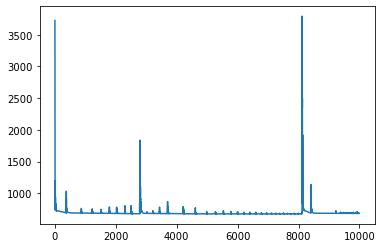

In [130]:
plt.plot(losses)

In [131]:
p

tensor([[124.9273],
        [ 77.8484],
        [190.1577],
        ...,
        [ 41.7466],
        [ 35.7206],
        [ 42.9183]], grad_fn=<ReluBackward0>)